# Exploring users on r/harrypotter

Various functions used for this amnalysis can be found in `RedditHP.py`

## Setup

In [1]:
# import own functions from reddit_funcs.py
try:
    from RedditHP import *
except ModuleNotFoundError:
    !pip install -r requirements.txt
    from RedditHP import *

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Getting the Reddit Data

First we download data from the r/harrypotter subreddit using the pushshift API

In [ ]:
# get data and preprocess
df_submissions = get_submissions()
df_submissions = preprocess_submissions(df_submissions)
# print(df_submissions)

Loading existing raw data
Loaded raw data


### Preprocessing Data
We now preprocess the raw data from r/harrypotter

First we add a _house_ attribute to the submissions dataframe containing the name of the Hogwarts House of the user

In [ ]:
df_submissions = preprocess(df_submissions)

## Activity on other subreddits
Lets take a look at the activity of the most active users on r/harrypotter, when they are active on other subreddits.

First the subreddits for the top 100 (due to restrictions from the API) users are found

In [ ]:
# subreddits for top users
author_subreddits = get_top_author_subreddits(df_submissions)
# author_subreddits.sort_values(by='author')

Now users with activity on more than 20 subreddits are found

In [ ]:
chosen_users = chose_users(author_subreddits, limit = 20)
# chosen_users

The chosen users activity (submissions and comments) on the other subreddits is collected with the PushshiftAPI

In [ ]:
# activity = get_activity_of_users(chosen_users)
activity = get_activity_of_users()
# activity

### Word Clouds for the selected users

First we tokenize and clean the text of the users' posts. Then a document for each user is created

In [ ]:
author_text_docs = get_author_tokens(activity)
author_text_docs

100%|██████████| 11142/11142 [00:04<00:00, 2560.78it/s]


author
Bleepbloopbotz2         [guys, rec, fics, featuring, hot, ron, respons...
EquivalentInflation     [star, wars, obi, wan, chosen, know, prophecy,...
LiopleurodonMagic       [anyone, know, good, fm, station, weather, rel...
M-Saga                  [riz, ahmed, first, muslim, nominated, best, a...
Ok_Fennel6151           [akame, art, hqas, akame, art, seiorai, manga,...
PeevesPoltergist        [makes, queen, legendary, queen, legend, statu...
Psychological-Fall57    [moment, final, arci, thought, funny, jean, ye...
RunningTURTL            [watching, fortnite, season, event, remind, ce...
SirAren                 [billie, joe, instagram, account, happened, fa...
SkootNasty              [cover, call, al, yesterday, thought, might, d...
Vocadofries             [jankiest, close, reality, present, fears, lov...
amit0k                  [always, nice, remote, island, national, panda...
coolbean36              [good, dudley, goes, hogwarts, fanfics, prefer...
coolguydude56           [george

Now we can calculate the TF-IDF

In [ ]:
tf, tf_idf = TF_IDF(author_text_docs, author_text_docs)

for i in range(len(tf)):
    print(chosen_users[i])
    word_tf, _ = zip(*tf[i].most_common(10))
    print(f"{'Top 10 TF Words:':<30s}{word_tf}")
    word_tfidf, _ = zip(*tf_idf[i].most_common(10))
    print(f"{'Top 10 TF-IDF Words:':<30s}{word_tfidf}")
    print(f"{'Common words:':<30s}{set(word_tf).intersection(set(word_tfidf))}")
    print("\n")

Bleepbloopbotz2
Top 10 TF Words:              ('gt', 'harry', 'ron', 'like', 'hermione', 'one', 'would', 'lol', 'really', 'fic')
Top 10 TF-IDF Words:          ('fic', 'fics', 'linkffn', 'gt', 'indulgent', 'colin', 'comedy', 'ron', 'humour', 'diana')
Common words:                 {'gt', 'ron', 'fic'}


PeevesPoltergist
Top 10 TF Words:              ('people', 'like', 'would', 'also', 'one', 'could', 'even', 'time', 'well', 'get')
Top 10 TF-IDF Words:          ('hickey', 'shield', 'miguel', 'hydra', 'serial', 'palpatine', 'bandit', 'anakin', 'obi', 'jedi')
Common words:                 set()


SirAren
Top 10 TF Words:              ('like', 'really', 'people', 'get', 'know', 'water', 'good', 'thanks', 'think', 'much')
Top 10 TF-IDF Words:          ('sediment', 'trashcans', 'water', 'hoa', 'backyard', 'acne', 'knives', 'oxygen', 'husband', 'license')
Common words:                 {'water'}


Ok_Fennel6151
Top 10 TF Words:              ('game', 'update', 'iphone', 'thanks', 'connect', 'itun

Then we can create the world clouds from the TF-IDF

100%|██████████| 3/3 [00:16<00:00,  5.46s/it]


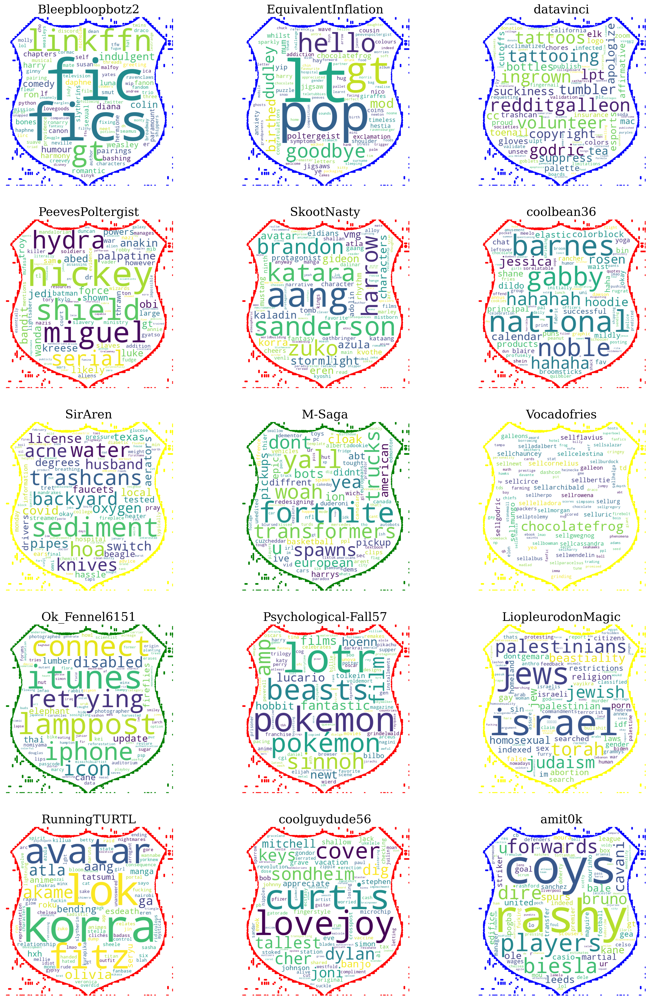

In [ ]:
create_user_wordclouds(chosen_users, tf_idf, df_submissions, height=5)

## Interactions between houses on r/harrypotter

### Get comments
First all the comments on the submissions are getched with the Pushshift API and their the users house is appended

In [ ]:
# get comments
df_comments = get_comments(df_submissions=None)
#preprocess
df_comments = preprocess_comments(df_comments=None)

Loading existing raw data
Loaded raw data


### Interactions on a House level
For each type of interaction (e.g. Gryffindor-to-Slytherin) a row in a dataframe will be created with various information, such as sentiments analysis values

In [2]:
interactions = create_interactions(df_comments=None)
# interactions

In [ ]:
# interactions.vader
houses = ["Gryffindor", "Hufflepuff", "Ravenclaw", "Slytherin"]
pd.DataFrame(np.array(interactions.happiness).reshape(4,4), index = houses, columns = houses) # row = sender, column = receiver

,Gryffindor,Hufflepuff,Ravenclaw,Slytherin
Gryffindor,5.620537,5.662133,5.615845,5.610254
Hufflepuff,5.649963,5.702656,5.651462,5.618919
Ravenclaw,5.649563,5.630834,5.638753,5.614480
Slytherin,5.643315,5.636083,5.596201,5.635242


### Wordclouds
Let's look at the wordclouds for the different type of interactions. Here we can not only use TF-IDF or TF, but also chose to use the emotion scores to see the most present emotions

100%|██████████| 4/4 [00:08<00:00,  2.24s/it]


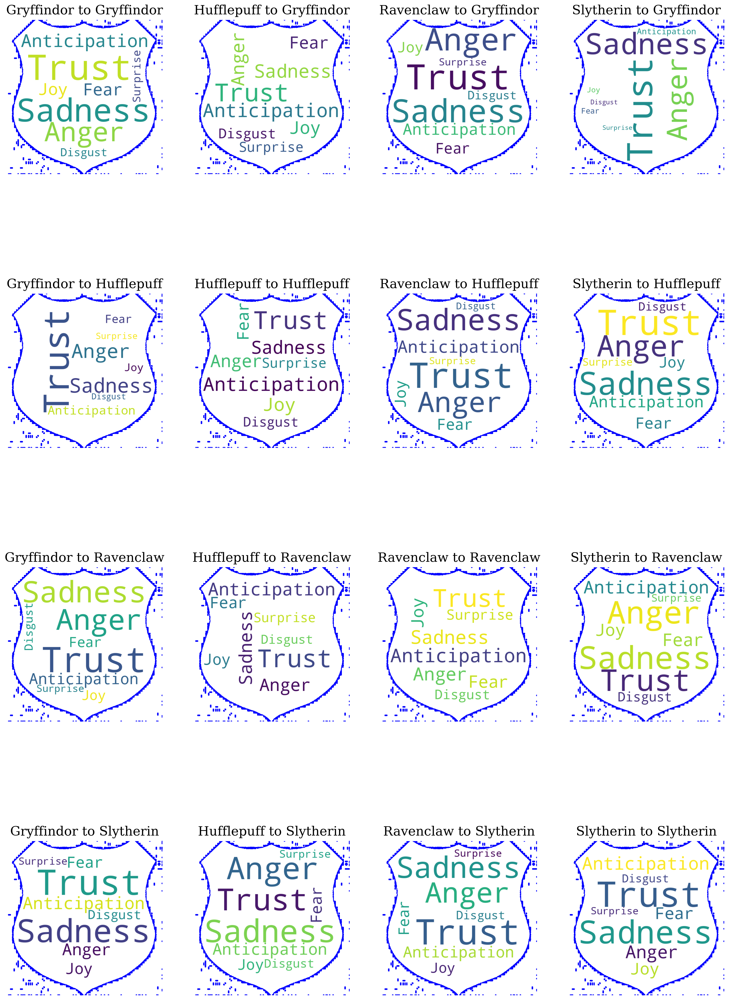

In [4]:
# interaction_wordclouds(interactions, freq_type = "TF_IDF", save_as = "figures/wordcloud_comments_houses_tf_idf.png")
interaction_wordclouds(interactions, freq_type = "emotion_score")

# Interactive

In [ ]:
# !pip install ipywidgets
# from __future__ import print_function
# from ipywidgets import interact, interactive, fixed, interact_manual
# import ipywidgets as widgets

     |████████████████████████████████| 121 kB 19.5 MB/s 
     |████████████████████████████████| 2.2 MB 54.2 MB/s 
     |████████████████████████████████| 243 kB 61.8 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
# # def emotion_score(str:emotion):
# #     return interactions.emotion_score[0][emotion]

# def f(x):
#     return x

# interact(f, x = 10)

10

<function __main__.f(x)>

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=85fb65b4-b596-4730-837e-04e86eafe419' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>